# Frequency analysis of processed data
Here the frequency dependence of the final data is analysed



In [1]:
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use("seaborn")
import numpy as np
import matplotlib.dates as mdates
from scipy import optimize
import matplotlib.patches as patches
from collections import defaultdict
from datetime import timedelta
from datetime import datetime
import pickle
from ipywidgets import interact
import ipywidgets as widgets
from copy import deepcopy#, copy
from scipy.fft import fft, fftfreq, rfft, rfftfreq, irfft

import plotly
import plotly.express as px
import kaleido

%load_ext autoreload
%autoreload 2
from my_func_mvw.functions import find_nearest_date, calc_diff_between_channels, read_pickle, write_pickle, temp_watertank_func, calc_stat_of_difference, carpet_plot_with_gaps, save_values_in_file, add_nan_val_in_datagaps
from my_func_mvw.fourier_transform_func import resample_data_func, plot_frequency_spectrum, fourier_transform, calc_fourier_carpet_data, plot_fourier_carpet
from my_func_mvw.functions_import_my_database import import_tlogger

plot_save=True #True False
masterthesis_save=False #True False
show_large_plot=True #True False

path_DTS_processed = r"..\Alsdorf\Daten\DTS_processed"
importer = "pickle" #csv pickle #does not work for tlogger at the moment

print("Some Version information of the imported packages")
print(f"pandas version: {pd.__version__}")
print(f"pickle version: {pickle.format_version}")

Some Version information of the imported packages
pandas version: 1.3.4
pickle version: 4.0


In [2]:
# Import data
# Channels 1 to 4
chan14_processed = read_pickle(path_DTS_processed + "\import_data_scripts\data_ch1-4_processed_constshifted")
shaft_chan_14={}
for chan in ["1","2","3","4"]:
    shaft_chan_14[chan] = read_pickle(path_DTS_processed + r"\shaft_temperatures\old_cable\pickle" + f"\\Schacht_chan_{chan}")

# Channels 5 to 8
Schacht_7and8_0_down = read_pickle(path_DTS_processed + r"\shaft_temperatures\egrt_cable\pickle" + "\\Schacht_7and8_down")
Schacht_7and8_0_up = read_pickle(path_DTS_processed + r"\shaft_temperatures\egrt_cable\pickle" + "\\Schacht_7and8_up")
chan58_constshift_averagefirst = read_pickle(path_DTS_processed + "\import_data_scripts\mean_ch5-8_constshift_averagefirst")
data_all_unprocessed = read_pickle(path_DTS_processed + "\import_data_scripts\data_all")

# watertank temperature
# Import TLogger
df_Tlogger, df_Tlogger_PT1000 = import_tlogger(path_DTS_processed=path_DTS_processed,importer=importer)

# Water tank temperature

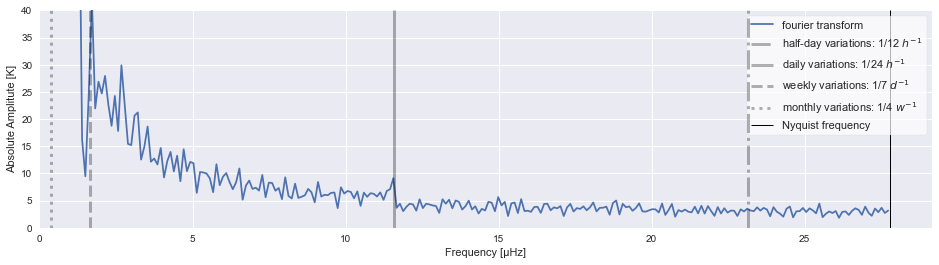

In [3]:
# frequency spectrum tlogger
data_resample, sampling_time, nyquist_frequqncy = resample_data_func(df_Tlogger["Channel1_rolling_mean"])

# Remove date gaps for tlogger, meaning delete points so neighbaring points are atleast similar in time of day
bool_no_data=data_resample.notna() == False
bool_data=data_resample.notna()

# set some more values to false so the data gaps are aligned regarding time
val_to_set_false=[178,179,180,198,199,200,201,278,279]
for val_set_false in val_to_set_false:
    bool_data[val_set_false] = False
data_resample=data_resample[bool_data]

# Check if everything is as expected with this code
diff=data_resample[bool_data].index[1:] - data_resample[bool_data].index[:-1]
diff.sort_values() #diff should be all around 5 h, ignoring full days
# diff.get_loc(diff.sort_values()[-1])

# Fourier Transform
yf, xf = fourier_transform(data_resample, sampling_time)

# Plot fourire spectrum
vlines=[]
vlines_labels=[]
plot_frequency_spectrum(xf, yf, vlines, vlines_labels, nyquist_frequqncy, ylim=[0,40])

if plot_save:
    if masterthesis_save:
        plt.savefig(r"C:\Users\Mathis\Desktop\Masterthesis\Masterthesis_tex\figs\chap4\watertank_temperature_fourier.pdf", format="pdf",bbox_inches="tight")
        plt.savefig(r"C:\Users\Mathis\Desktop\Masterthesis\Masterthesis_tex\figs_raster\chap4\watertank_temperature_fourier.png", format="png",bbox_inches="tight",dpi=300)
    plt.savefig("pictures\watertank_temperature_fourier.png")
plt.show()

# the logger has some data gaps which influences this spectrum

# Channels 1 to 4

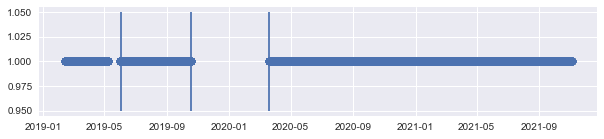

In [4]:
# Visualize data gaps
data=chan14_processed["1"][100].index
plt.figure(figsize=(10,2))
plt.scatter(data.to_pydatetime(), np.ones(len(data)))
plt.vlines([data[20300],data[20200],data[7800]],0.95,1.05)
plt.show()

In [5]:
# Calculate frequency spectrum carpet 
if show_large_plot:
    data_fourier_carpet={}
    for channel in ["1","2","3","4"]: #only use data after big data gap
        if channel=="3": # contains nan values
            col=chan14_processed[channel].columns[:-1]
            dat=chan14_processed[channel][col]
        else:
            dat=chan14_processed[channel]
        data_fourier_carpet[channel]=dat.iloc[31000:]

    # calc fourier carpet spectrum of final data
    df_yf_ch14 = calc_fourier_carpet_data(data_input=data_fourier_carpet,channels=["1","2","3","4"])
    del data_fourier_carpet # not needed anymore

    # clalc mean of all channels
    col=df_yf_ch14["2"].columns
    df_yf_ch14["mean_all"]=(df_yf_ch14["1"][col]+df_yf_ch14["2"][col]+df_yf_ch14["3"][col]+df_yf_ch14["4"][col])/4

In [6]:
# Plot frequency spectrum carpet 
if show_large_plot:
    # plot fourier carpet spectrum of single channels
    # for chan in ["1","2","3","4"]:
    #     print(f"{chan}")
    #     plot_fourier_carpet(df_yf_ch14[chan],chan)
    
    plot_fourier_carpet(df_yf_ch14["mean_all"],"mean_all",zmax=15,zmin=5,mastertheseis_save=masterthesis_save)
    # if plot_save is active the plot looks not correct here because for saving different settings have to used

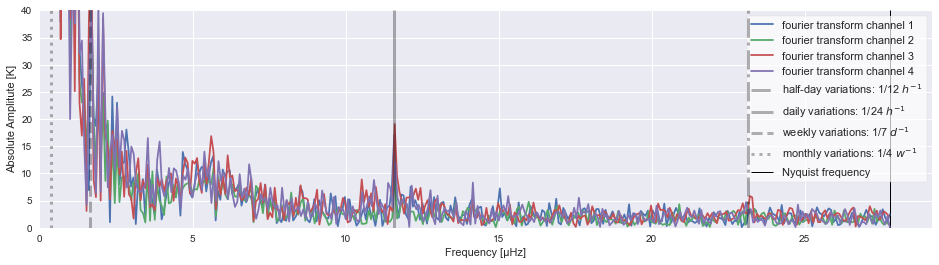

In [7]:
# Frequency spectrum of one cable length
cable_length=71
data_type="data_all"
ylim=[0,40]

data_resample={}
sampling_time={}
yf={}
xf={}
dates_iloc_begin=60000
#31000: before is a larg data gap
#55000: approx begin of water tank existanes?; daily variations are lower than before
for channel in ["1","2","3","4"]:
    # for cable_length in [65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80]:
    # looks liek water tank, I could also average multiple length for watertank correction

    # im wassertank höhere daily variation als außerhalb, wo es im Boden ist
    # mehr als bei channels 5 to 8
    # warum? Ideen: Kabel dünner, liegt im Wassertank anders
    # Vor Wassertank, im Gebäude daily variation noch viel höher

    if data_type == "data_all": #raw data
        data=data_all_unprocessed[channel][cable_length][dates_iloc_begin:]

    # Resample data
    data_resample[channel], sampling_time[channel], nyquist_frequency = resample_data_func(data)

    # Fourier Transform
    yf[channel], xf[channel] = fourier_transform(data_resample[channel], sampling_time[channel])

# Plor fourier Spectrum
vlines=[] 
vlines_labels=[]
#print(f"channel {channel}; cable length or depth: {data.name} m")
plot_frequency_spectrum(xf, yf, vlines, vlines_labels,nyquist_frequency, ylim=ylim)

if cable_length == 71 and data_type=="data_all" and ylim==[0,40] and dates_iloc_begin == 60000:
    if plot_save:
        if masterthesis_save:
            plt.savefig(r"C:\Users\Mathis\Desktop\Masterthesis\Masterthesis_tex\figs\chap4\chan14_cable_length_71_fourier.pdf", format="pdf",bbox_inches="tight")
            plt.savefig(r"C:\Users\Mathis\Desktop\Masterthesis\Masterthesis_tex\figs_raster\chap4\chan14_cable_length_71_fourier.png", format="png",bbox_inches="tight",dpi=300)
        plt.savefig("pictures\chan14_cable_length_71_fourier.png")
plt.show()

frequency spectrum of transformed data


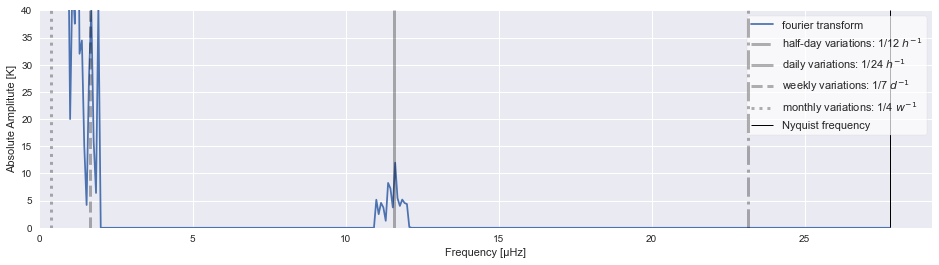

filtered signal


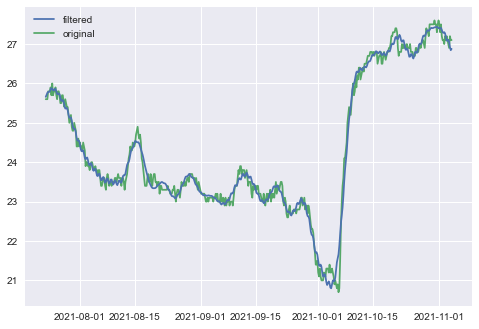

In [8]:
# Signal Filtering - specific filter functions exists, which minimise artefacts
# Here I just tested what happens if I do it by hand
channel="4"
f_signal = yf[channel]
W = xf[channel]
# 1 day fluctutation:
T_day=24*60*60
f_day=1/T_day

# remove frequencies from signal
cut_f_signal = f_signal.copy()
cut_f_signal[(W>1.05*f_day)] = 0
cut_f_signal[((W<0.95*f_day) & (W>2e-6))] = 0
#cut_f_signal[(W>0.8e-6)] = 0

print("frequency spectrum of transformed data")
plot_frequency_spectrum(W, cut_f_signal, vlines, vlines_labels,nyquist_frequency, ylim=[0,40])
plt.show()

# Retransfrom
cut_signal = irfft(cut_f_signal)

print("filtered signal")
dates_for_plot=500 #only show last x days
plt.plot(data_resample[channel].index[-dates_for_plot:].to_pydatetime(),cut_signal[-dates_for_plot:],label="filtered",zorder=10) #depending on channel add [1:]
plt.plot(data_resample[channel].index[-dates_for_plot:].to_pydatetime(),data_resample[channel].values[-dates_for_plot:],label="original",zorder=1)
plt.legend()
plt.show()

# force filtered signal to show dayly variations
# Are these real, or device dependent? Needs to be answered to justify corrections which exclude specidif frequencies

# Channels 5 to 8

In [9]:
#changes all settings so all plots for thesis are generated
save_counter=0
for data_type in ["data_all"]:
    for cable_length in [24,28,503,508]:
        for drop_egrt_dates in [True,False]:
            for ylim in [[0,200],[0,40]]:
                #additional loops here


                for channels in [["5","6","7","8"],["5","6","8"]]:
                    #clear variables which are used later
                    data_resample={}; sampling_time={}; yf={}; xf={} 
                    for channel in channels:
                        if data_type == "data_all_processed":
                            data=chan58_constshift_averagefirst[channel][cable_length]
                        elif data_type=="data_all":
                            data=data_all_unprocessed[channel][cable_length]

                        # Resample data
                        data_resample[channel], sampling_time[channel], nyquist_frequqncy = resample_data_func(data,resample_hours=5)
                        if channel in ["5","6","5and6"]:
                            # Remove date gaps, meaning delete points so neighbaring points are atleast similar in time of day
                            bool_no_data=data_resample[channel].notna() == False
                            bool_data=data_resample[channel].notna()

                            # data gaps fits already good
                            data_resample[channel]=data_resample[channel][bool_data]

                            # Check if everything is as expected with this code
                            # diff=data_resample[bool_data].index[1:] - data_resample[bool_data].index[:-1]
                            # diff.sort_values() #diff should be all around 5 h, ignoring full days
                            # # diff.get_loc(diff.sort_values()[-1])

                        if drop_egrt_dates:
                            if channel in ["7","8","7and8"]: # check if increased frequency even in shaft are from EGRT
                                #drop EGRT dates
                                data_resample[channel]=data_resample[channel].drop(data_resample[channel].index[190:248])
                
                        # Fourier Transform
                        yf[channel], xf[channel] = fourier_transform(data_resample[channel], sampling_time[channel])

                    # loop goes to all channels and then plot is generated with given settings of upper loops

                    # Plor fourier Spectrum
                    vlines=[]
                    vlines_labels=[]
                    plot_frequency_spectrum(xf, yf, vlines, vlines_labels,nyquist_frequqncy, ylim=ylim)

                    # Save plot
                    if cable_length == 24 and data_type=="data_all" and drop_egrt_dates==True and channels==["5","6","7","8"] and ylim==[0,40]:
                        if plot_save:
                            if masterthesis_save:
                                plt.savefig(r"C:\Users\Mathis\Desktop\Masterthesis\Masterthesis_tex\figs\chap4\chan58_cable_length_24_fourier.pdf", format="pdf",bbox_inches="tight")
                                plt.savefig(r"C:\Users\Mathis\Desktop\Masterthesis\Masterthesis_tex\figs_raster\chap4\chan58_cable_length_24_fourier.png", format="png",bbox_inches="tight",dpi=300)
                            plt.savefig("pictures\chan58_cable_length_24_fourier.png")
                            save_counter+=1

                    if cable_length == 28 and data_type=="data_all" and drop_egrt_dates==True and channels==["5","6","8"] and ylim==[0,200]:
                        if plot_save:
                            if masterthesis_save:
                                plt.savefig(r"C:\Users\Mathis\Desktop\Masterthesis\Masterthesis_tex\appendix\chan58_cable_length_28_fourier.pdf", format="pdf",bbox_inches="tight")
                                plt.savefig(r"C:\Users\Mathis\Desktop\Masterthesis\Masterthesis_tex\appendix_raster\chan58_cable_length_28_fourier.png", format="png",bbox_inches="tight",dpi=300)
                            plt.savefig("pictures\chan58_cable_length_28_fourier.png")
                            save_counter+=1

                    if cable_length == 508 and data_type=="data_all" and drop_egrt_dates==False and channels==["5","6","8"] and ylim==[0,200]:
                        if plot_save:
                            if masterthesis_save:
                                plt.savefig(r"C:\Users\Mathis\Desktop\Masterthesis\Masterthesis_tex\appendix\chan58_cable_length_508_fourier.pdf", format="pdf",bbox_inches="tight")
                                plt.savefig(r"C:\Users\Mathis\Desktop\Masterthesis\Masterthesis_tex\appendix_raster\chan58_cable_length_508_fourier.png", format="png",bbox_inches="tight",dpi=300)
                            plt.savefig("pictures\chan58_cable_length_508_fourier.png")
                            save_counter+=1

                    if cable_length == 503 and data_type=="data_all" and drop_egrt_dates==False and channels==["5","6","8"] and ylim==[0,200]:
                        if plot_save:
                            if masterthesis_save:
                                plt.savefig(r"C:\Users\Mathis\Desktop\Masterthesis\Masterthesis_tex\appendix\chan58_cable_length_503_fourier.pdf", format="pdf",bbox_inches="tight")
                                plt.savefig(r"C:\Users\Mathis\Desktop\Masterthesis\Masterthesis_tex\appendix_raster\chan58_cable_length_503_fourier.png", format="png",bbox_inches="tight",dpi=300)
                            plt.savefig("pictures\chan58_cable_length_503_fourier.png")
                            save_counter+=1
                    
                    if plot_save:
                        plt.close()
                    else:# change if you want to see the plots
                        plt.close() 
                        # plt.show()
if plot_save:
    if save_counter==4:
        print("Passed: saved all plots")
    else:
        print("Error: did not save all plots")
        print(save_counter)

Passed: saved all plots


In [10]:
# Carpet plot of fourier spectrum
if show_large_plot:
    # calc fourier carpet spectrum of final data
    df_yf = calc_fourier_carpet_data(data_input=chan58_constshift_averagefirst,channels=["5and6","7and8"])

    # plot fourier carpet spectrum of final data
    plot_fourier_carpet(df_yf["5and6"],"5and6",zmin=5,zmax=15,mastertheseis_save=masterthesis_save)
    plot_fourier_carpet(df_yf["7and8"],"7and8",zmin=5,zmax=15,mastertheseis_save=masterthesis_save)
    # if plot_save is active the plot looks not correct here because for saving different settings have to used

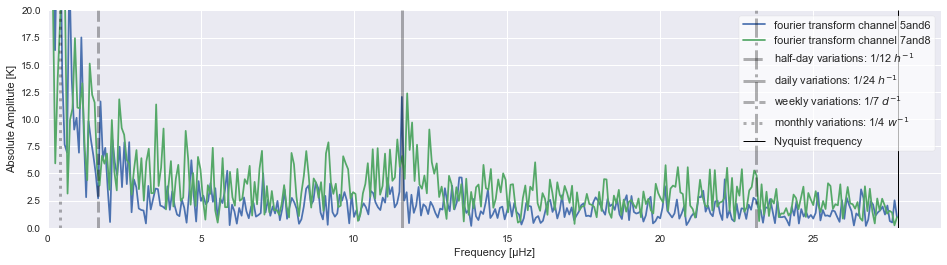

In [ ]:
# Plot fourier spectrum of a specific cable length

#### Input
cable_length=800
data_type="data_all_processed_constshifted_averagefirst_additionalcorr" #"data_ch58_unprocessed"
drop_egrt_dates=True #for channels 7 and 8
#watertank_len: [24,1689,1723,3389]
channels=["5and6","7and8"]# ["5","6","7","8"] #["5","6","8"] #["5and6","7and8"]
###################

yf={};xf={};data_resample={};sampling_time={}
for channel in channels:
    if data_type=="data_ch58_unprocessed":
        data=data_all_unprocessed[channel][cable_length]
    elif data_type=="data_all_processed_constshifted_averagefirst_additionalcorr":
        data=chan58_constshift_averagefirst[channel][cable_length]

    # Resample data
    data_resample[channel], sampling_time[channel], nyquist_frequqncy = resample_data_func(data,resample_hours=5)
    if channel in ["5","6","5and6"]:
        # Remove date gaps, meaning delete points so neighbaring points are atleast similar in time of day
        bool_no_data=data_resample[channel].notna() == False
        bool_data=data_resample[channel].notna()

        # data gaps fits already good
        data_resample[channel]=data_resample[channel][bool_data]

        # Check if everything is as expected with this code
        # diff=data_resample[bool_data].index[1:] - data_resample[bool_data].index[:-1]
        # diff.sort_values() #diff should be all around 5 h, ignoring full days
        # # diff.get_loc(diff.sort_values()[-1])

    if drop_egrt_dates:
        if channel in ["7","8","7and8"]: # check if increased frequency even in shaft are from EGRT
            #drop EGRT dates
            data_resample[channel]=data_resample[channel].drop(data_resample[channel].index[190:248])

    # Fourier Transform
    yf[channel], xf[channel] = fourier_transform(data_resample[channel], sampling_time[channel])

# Plor fourier Spectrum
vlines=[]
vlines_labels=[]
plot_frequency_spectrum(xf, yf, vlines, vlines_labels,nyquist_frequqncy, ylim=[0,20])
plt.show()# saving plots is done in one of the above cells

frequency spectrum of transformed data


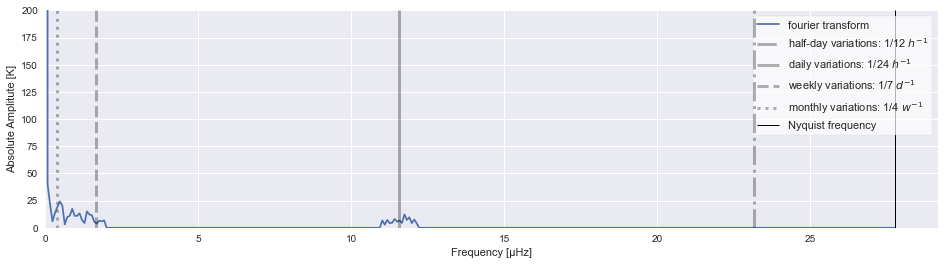

filtered signal


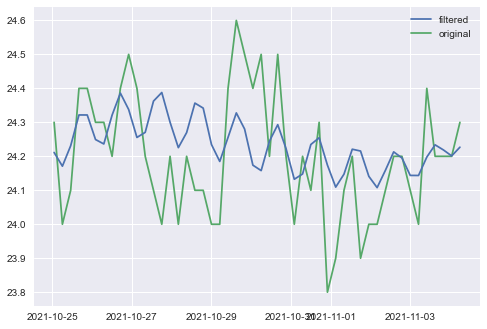

In [ ]:
# Signal Filtering - specific filter functions exists, which minimise artefacts
# Here I just tested what happens if I do it by hand
channel="7and8"
#Signal Filtering
f_signal = yf[channel]
W = xf[channel]
# 1 day fluctutation:
T_day=24*60*60
f_day=1/T_day

# remove frequencies from signal
cut_f_signal = f_signal.copy()
cut_f_signal[(W>1.05*f_day)] = 0
cut_f_signal[((W<0.95*f_day) & (W>2e-6))] = 0
#cut_f_signal[(W>0.8e-6)] = 0

print("frequency spectrum of transformed data")
plot_frequency_spectrum(W, cut_f_signal, vlines, vlines_labels,nyquist_frequqncy, ylim=[0,200])
plt.show()

# Retransfrom
cut_signal = irfft(cut_f_signal)

print("filtered signal")
dates_plot_pos=50 #only show last x days
plt.plot(data_resample[channel].index[-dates_plot_pos:][:],cut_signal[-dates_plot_pos:],label="filtered",zorder=10) #depending on channel add [1:]
plt.plot(data_resample[channel].index[-dates_plot_pos:],data_resample[channel].values[-dates_plot_pos:],label="original",zorder=1)
plt.legend()
plt.show()